In [2]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torch.utils.data import DataLoader, Dataset
from PIL import Image
from collections import defaultdict
from tqdm import tqdm
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os

In [3]:
base_directory = os.getcwd()
data_directory = os.path.join(base_directory, "data")
print("Base Directory:", base_directory)
print("Data Directory:", data_directory)

data_dirs = os.listdir(data_directory)


Base Directory: /Users/brad/Desktop/Plant_Pal
Data Directory: /Users/brad/Desktop/Plant_Pal/data


In [4]:
species_dict = {}

for data_dir in data_dirs:
    if data_dir == ".DS_Store":
        continue
    image_files = os.listdir(os.path.join(data_directory, data_dir))
    species, label = data_dir.split('___')  # how species and label are delineated in filenames
    if species in species_dict:
        species_dict[species][label] = image_files
    else:
        species_dict[species] = {label: image_files}    # instantiate a new dict for the species

print(species_dict)

{'Tomato': {'spider_mites': ['71913.jpg', '71907.jpg', '72598.jpg', '71708.jpg', '72201.jpg', '72567.jpg', '72573.jpg', '72215.jpg', '71734.jpg', '71720.jpg', '72229.jpg', '71293.jpg', '71287.jpg', '72765.jpg', '72003.jpg', '72017.jpg', '72771.jpg', '71278.jpg', '72759.jpg', '71250.jpg', '71536.jpg', '71522.jpg', '71244.jpg', '72836.jpg', '72188.jpg', '71481.jpg', '71495.jpg', '72822.jpg', '71318.jpg', '72611.jpg', '72177.jpg', '72163.jpg', '72605.jpg', '71324.jpg', '71442.jpg', '71456.jpg', '71330.jpg', '72639.jpg', '71867.jpg', '71873.jpg', '71683.jpg', '71697.jpg', '72375.jpg', '72413.jpg', '72407.jpg', '72361.jpg', '71668.jpg', '72349.jpg', '71898.jpg', '71640.jpg', '71654.jpg', '71655.jpg', '71641.jpg', '71899.jpg', '72348.jpg', '72406.jpg', '71669.jpg', '72360.jpg', '72374.jpg', '72412.jpg', '71696.jpg', '71682.jpg', '71872.jpg', '71866.jpg', '71457.jpg', '72638.jpg', '71331.jpg', '71325.jpg', '71443.jpg', '72162.jpg', '72604.jpg', '72610.jpg', '71319.jpg', '72176.jpg', '71494.jp

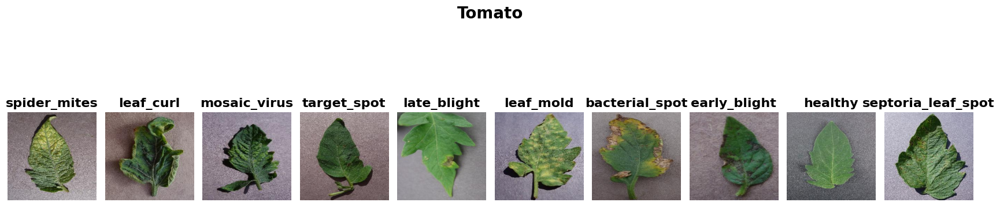

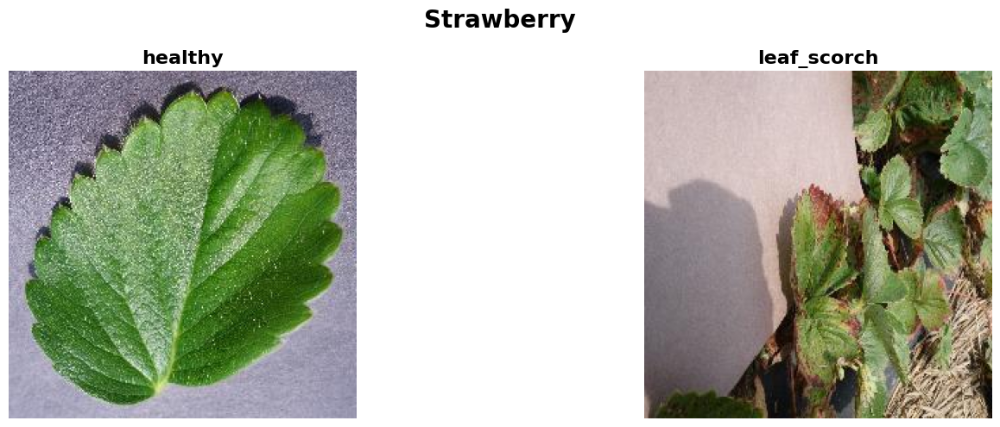

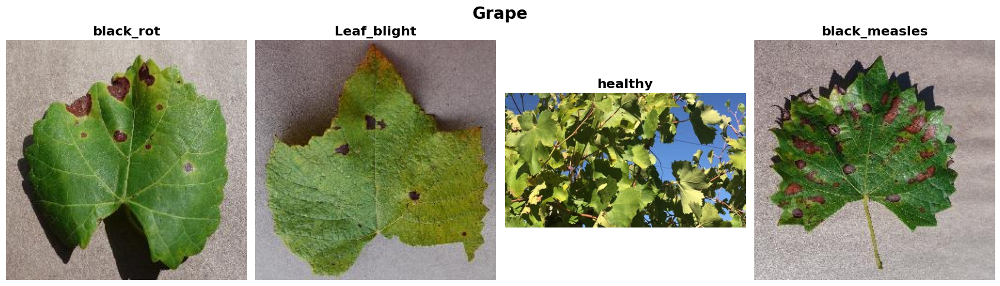

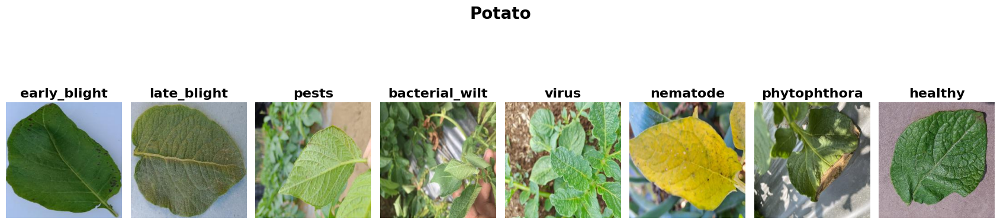

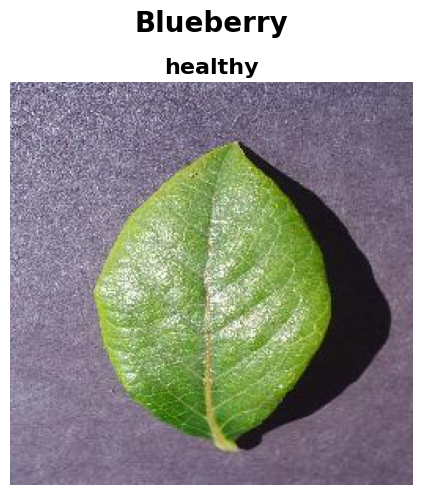

...

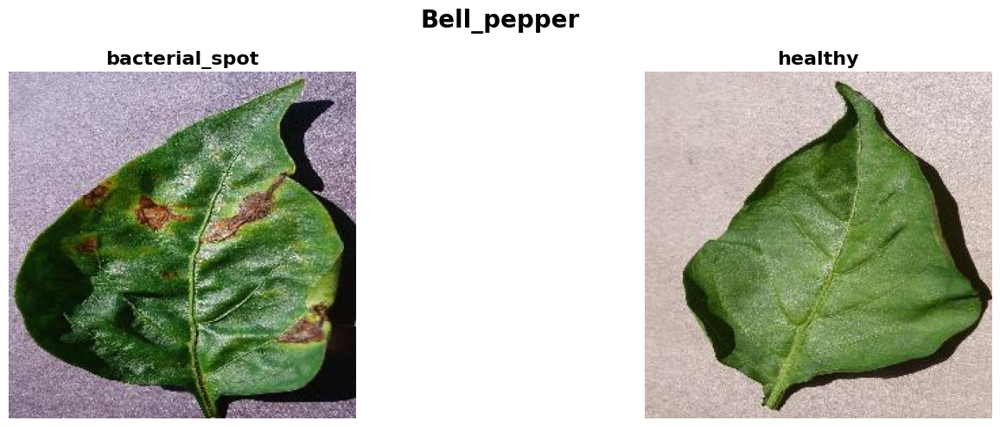

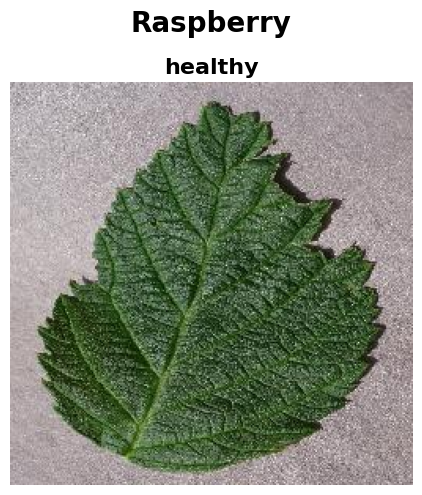

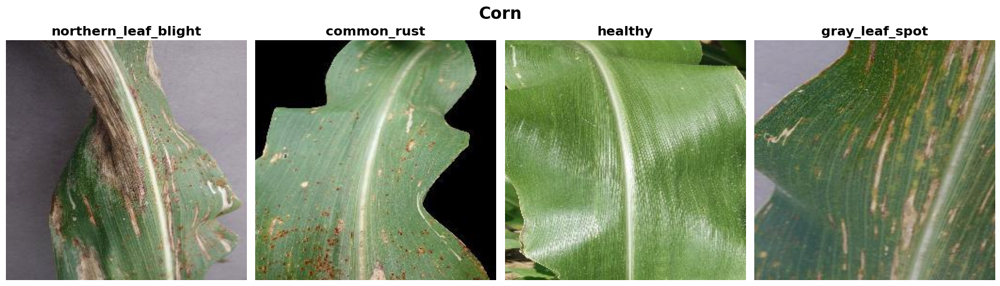

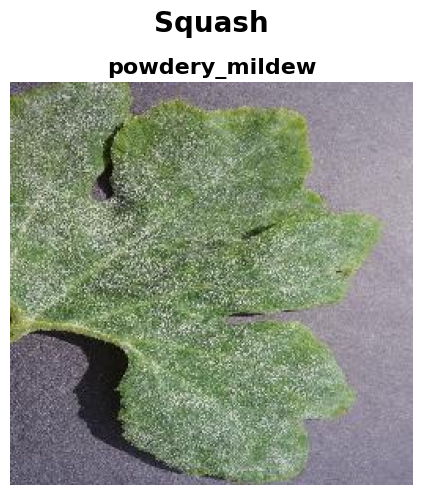

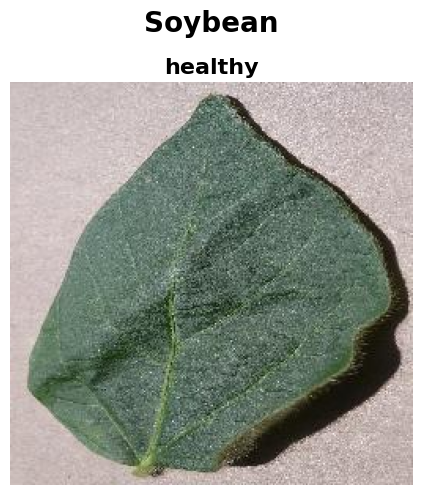

In [5]:
for species, conditions in species_dict.items():
    image_paths = []
    labels = []
    for cond, image_files in conditions.items():
        image_dir = os.path.join(data_directory, species + '___' + cond)
        image_path = image_files[0]
        image_paths.append(os.path.join(image_dir, image_path))
        labels.append(cond)

    num_images = len(image_paths)

    fig, axes = plt.subplots(1, num_images, figsize=(17, 5))
    fig.suptitle(species, fontsize=20, weight='bold')  # Add a bigger title for each cluster
    
    if num_images == 1:
        axes = [axes]
    for ax, img_path, label in zip(axes, image_paths, labels):
        image = Image.open(img_path)
        ax.imshow(image)
        ax.set_title(label, fontsize=16, weight='bold')
        ax.axis('off')  # Hide the axis

    plt.tight_layout()
    plt.show()

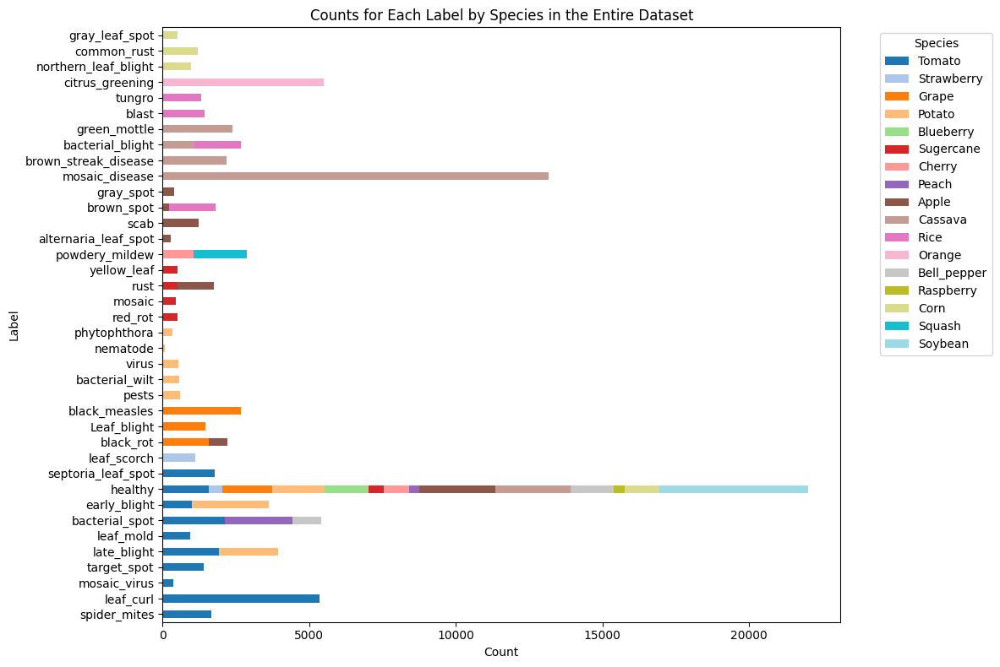

In [7]:
species_label_counts = {}

for species, conditions in species_dict.items():
    for cond, image_files in conditions.items():
        if species not in species_label_counts:
            species_label_counts[species] = {}
        if cond in species_label_counts[species]:
            species_label_counts[species][cond] += len(image_files)
        else:
            species_label_counts[species][cond] = len(image_files)

# Convert the dictionary to a pandas DataFrame for easier plotting
species_label_counts_df = pd.DataFrame(species_label_counts).fillna(0)

# Plot the counts as a stacked horizontal bar graph

species_label_counts_df.plot(kind='barh', stacked=True, figsize=(12, 8), colormap='tab20')
plt.title('Counts for Each Label by Species in the Entire Dataset')
plt.xlabel('Count')
plt.ylabel('Label')
plt.legend(title='Species', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

In [6]:
healthy_count = 0
non_healthy_count = 0

for species, labels in species_label_counts.items():
    for label, count in labels.items():
        if label == 'healthy':
            healthy_count += count
        else:
            non_healthy_count += count

print(f"Healthy labeled images: {healthy_count}")
print(f"Non-healthy labeled images: {non_healthy_count}")

Healthy labeled images: 22015
Non-healthy labeled images: 75281


In [10]:
class_dict = {}
for species, labels in species_label_counts.items():
    for label, count in labels.items():
        class_dict[species + '___' + label] = count
sorted_class_dict = dict(sorted(class_dict.items(), key=lambda item: item[1]))
print(sorted_class_dict)

{'Potato___nematode': 68, 'Apple___brown_spot': 215, 'Apple___alternaria_leaf_spot': 278, 'Potato___phytophthora': 347, 'Peach___healthy': 360, 'Raspberry___healthy': 371, 'Tomato___mosaic_virus': 373, 'Apple___gray_spot': 395, 'Strawberry___healthy': 456, 'Sugercane___mosaic': 462, 'Sugercane___yellow_leaf': 505, 'Corn___gray_leaf_spot': 513, 'Sugercane___rust': 514, 'Sugercane___red_rot': 518, 'Sugercane___healthy': 522, 'Potato___virus': 532, 'Potato___bacterial_wilt': 569, 'Potato___pests': 611, 'Apple___black_rot': 621, 'Cherry___healthy': 854, 'Tomato___leaf_mold': 952, 'Corn___northern_leaf_blight': 985, 'Bell_pepper___bacterial_spot': 997, 'Tomato___early_blight': 1000, 'Cherry___powdery_mildew': 1052, 'Cassava___bacterial_blight': 1087, 'Strawberry___leaf_scorch': 1109, 'Corn___healthy': 1162, 'Corn___common_rust': 1192, 'Apple___scab': 1222, 'Apple___rust': 1241, 'Rice___tungro': 1308, 'Tomato___target_spot': 1404, 'Rice___blast': 1440, 'Grape___Leaf_blight': 1476, 'Bell_pepp

In [10]:
aspect_ratio_counts = defaultdict(int)

for species, conditions in species_dict.items():
    for cond, image_files in tqdm(conditions.items()):
        for image_file in image_files:
            image_path = os.path.join(data_directory, species + '___' + cond, image_file)
            with Image.open(image_path) as img:
                # aspect_ratio = (img.width, img.height)
                aspect_ratio = img.width / img.height
                aspect_ratio_counts[aspect_ratio] += 1
                
sorted_aspect_ratios = sorted(aspect_ratio_counts.items(), key=lambda x: x[0], reverse=True)
for aspect_ratio, count in sorted_aspect_ratios:
    print(f"Aspect Ratio: {aspect_ratio}, Count: {count}")

100%|██████████| 1/1 [00:02<00:00,  2.85s/it]

Aspect Ratio: 3.0546875, Count: 1
Aspect Ratio: 2.56640625, Count: 1
Aspect Ratio: 2.5390625, Count: 1
Aspect Ratio: 2.48828125, Count: 1
Aspect Ratio: 2.3359375, Count: 1
Aspect Ratio: 2.328125, Count: 3
Aspect Ratio: 2.32421875, Count: 2
Aspect Ratio: 2.3203125, Count: 1
Aspect Ratio: 2.30859375, Count: 2
Aspect Ratio: 2.3046875, Count: 2
Aspect Ratio: 2.30078125, Count: 4
Aspect Ratio: 2.29296875, Count: 3
Aspect Ratio: 2.2890625, Count: 4
Aspect Ratio: 2.18359375, Count: 1
Aspect Ratio: 2.17578125, Count: 1
Aspect Ratio: 2.16796875, Count: 1
Aspect Ratio: 2.1171875, Count: 1
Aspect Ratio: 2.109375, Count: 230
Aspect Ratio: 2.07421875, Count: 1
Aspect Ratio: 2.0546875, Count: 1
Aspect Ratio: 1.9921875, Count: 1
Aspect Ratio: 1.9765625, Count: 1
Aspect Ratio: 1.890625, Count: 1
Aspect Ratio: 1.859375, Count: 1
Aspect Ratio: 1.77734375, Count: 1355
Aspect Ratio: 1.71484375, Count: 1
Aspect Ratio: 1.625, Count: 1
Aspect Ratio: 1.51171875, Count: 1
Aspect Ratio: 1.50390625, Count: 34
As

In [11]:
means = []
stds = []
# Iterate through each species and condition
for species, conditions in species_dict.items():
    for cond, image_files in conditions.items():
        for image_file in tqdm(image_files, desc=f"Processing {species} - {cond}"):
            image_path = os.path.join(data_directory, species + '___' + cond, image_file)
            with Image.open(image_path) as img:
                img_array = np.array(img) / 255.0  # Normalize pixel values to [0, 1]
                means.append(np.mean(img_array, axis=(0, 1)))
                stds.append(np.std(img_array, axis=(0, 1)))

# Convert lists to numpy arrays
means = np.array(means)
stds = np.array(stds)

# Calculate the overall mean and std for each channel
mean_per_channel = np.mean(means, axis=0)
std_per_channel = np.mean(stds, axis=0)

print(f"Mean per channel: {mean_per_channel}")
print(f"Std per channel: {std_per_channel}")

Processing Soybean - healthy: 100%|██████████| 5090/5090 [00:43<00:00, 117.17it/s]


Mean per channel: [0.45587662 0.49715131 0.37855863]
Std per channel: [0.18720555 0.17101169 0.19548449]
